In [1]:
# Import pacakge 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import ast
import numpy as np
import math

from config import configmovie
pd.options.mode.chained_assignment = None 

In [2]:
def clean_metadf(df_movies_metadata : pd.DataFrame) -> pd.DataFrame:

    # Assing helpder variable
    check1 = df_movies_metadata['adult'] != 'False'
    check2 = df_movies_metadata['adult'] != 'True'
    meta_diccol = configmovie.meta_diccol
    metadf_int = configmovie.metadf_int 
    metadf_float = configmovie.metadf_float  
    metadf_str = configmovie.metadf_str 
    metadf_date = configmovie.metadf_date 

    # Dealing with cut off data some data get cut off due to "," character in the text
    replace_col = df_movies_metadata.columns[10:]
    cutoff_df = df_movies_metadata.loc[check1 & check2]
    index_list = [x-1 for x in cutoff_df.index.to_list()]
    for i,row in enumerate(index_list):
        replace_val = cutoff_df.iloc[i].to_list()[1:15]
        for o,col in enumerate(replace_col):
                df_movies_metadata.iloc[row,df_movies_metadata.columns.get_loc(col)] = replace_val[o]
        df_movies_metadata.drop(cutoff_df.index.to_list(),axis=0,inplace=True)
        df_movies_metadata.reset_index(drop=True,inplace=True)

    # Fill missing value per column and remove duplicate
    for col in meta_diccol:
        df_movies_metadata[col] = df_movies_metadata[col].fillna("{'name': 'Non'}")

    df_movies_metadata = df_movies_metadata.drop_duplicates()

    # Chaning string dict to dict data type
    df_movies_metadata[meta_diccol[0]] = df_movies_metadata[meta_diccol[0]].apply(lambda x : ast.literal_eval(x))
    df_movies_metadata[meta_diccol[0]] = df_movies_metadata[meta_diccol[0]].str['name']


    # Change column data type
    df_movies_metadata['adult'] = df_movies_metadata['adult'] == 'True'
    df_movies_metadata[metadf_int] = df_movies_metadata[metadf_int].fillna(0).astype('int64')
    df_movies_metadata[metadf_float] = df_movies_metadata[metadf_float].fillna(0).astype('float')
    df_movies_metadata[metadf_str] = df_movies_metadata[metadf_str].fillna('Missing').astype('string')
    df_movies_metadata[metadf_date] = pd.to_datetime(df_movies_metadata[metadf_date].fillna('1990-01-01').stack(), format="%Y-%m-%d").unstack()
    
    # Create new column from date 
    df_movies_metadata['year'] = df_movies_metadata['release_date'].dt.year
    df_movies_metadata['period'] = df_movies_metadata.year.apply(lambda x : str(x-(x%10)) +' - ' + ( str((x-(x%10))+10))  \
                                    if (x-(x%10)) != 0 else str((x-(x%10))-10) +' - ' + ( str((x-(x%10)))))
    
    return df_movies_metadata

In [3]:
def clean_df(col : str,df : pd.DataFrame) -> pd.DataFrame:

    # Drop duplicate and create temp varible
    df = df.drop_duplicates()
    colcount=  'count' + col

    # Fill empty value and change text dict to dict type
    df[col] = df[col].fillna("{'name': 'Non'}")
    df[col] = df[col].apply(lambda x : ast.literal_eval(x))

    # Expand the dict column and add movieid column by counting the value
    df[colcount] = df[col].apply(lambda x : len(x) if len(x) >0 else 1)
    df_expand = pd.json_normalize(df[col].explode()) 
    df_expand['movieid'] = df['id'].repeat(df[colcount]).reset_index(drop=True).astype('int')

    # Fill empty value after expand
    df_expand.fillna('Missing',inplace=True)
     
    return df_expand

# Data Load and Clean

In [4]:
# Load in data 
df_keywords         = pd.read_csv('data/keywords.csv')
df_movies_metadata  = pd.read_csv('data/movies_metadata.csv')
df_credit           = pd.read_csv('data/credits.csv')

# Clean data and seperate data into table movie metadata file issue
df_movies_metadata = clean_metadf(df_movies_metadata)
df_cast             = clean_df('cast',df_credit)
df_crew             = clean_df('crew',df_credit)
df_keywords         = clean_df('keywords',df_keywords)
df_genre = clean_df('genres',df_movies_metadata[['genres','id']])
df_production_countries = clean_df('production_countries',df_movies_metadata[['production_countries','id']])
df_production = clean_df('production_companies',df_movies_metadata[['production_companies','id']])


# Drop column not use and change column name
df_genre.drop('id',inplace=True,axis=1)
df_production_countries.drop('iso_3166_1',inplace=True,axis=1)
df_movies_metadata.drop(configmovie.drop_moviemeta,axis=1,inplace=True)
df_cast.drop(configmovie.drop_cast,axis=1,inplace=True)
df_crew.drop(configmovie.drop_crew,axis=1,inplace=True)
df_production.drop(['id'],axis=1,inplace=True)
df_movies_metadata.rename(columns={'id':'movieid'},inplace=True)

# Merge dataset to use in visualization
df_main = df_movies_metadata.query("status == 'Released'")
df_visual = df_main.merge(df_production_countries,how='inner',on='movieid')
df_genremerge = df_main.merge(df_genre,how='inner',on='movieid')
df_main_rev = df_main.query("revenue != 0 and runtime != 0.0")
df_castmerge = df_main.merge(df_cast,how='inner',on='movieid')
df_crewmerge = df_main.merge(df_crew,how='inner',on='movieid')

c:\Users\B\AppData\Local\Programs\Python\Python39\lib\site-packages\IPython\core\interactiveshell.py:3457: DtypeWarning: Columns (10) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


# Visualization

Which country produce the most movie?

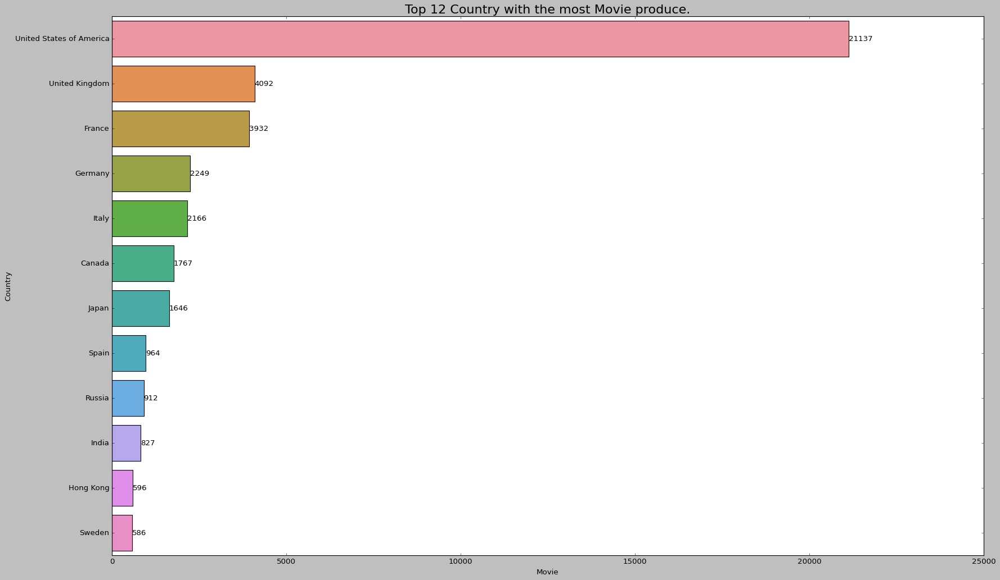

In [5]:
# Set varible and option
plt.style.use('classic')
plt.figure(figsize=(25,15))
rank = 12

# Prepare data for plot
df_plot = df_production_countries.query("name != 'Missing'").groupby('name').count().sort_values('movieid',ascending=False).nlargest(n=rank,columns='movieid').reset_index()
country_list = df_plot.name.values

# Plotting the data
ax = sns.barplot(data=df_plot,x='movieid',y='name')
plt.ylabel('Country')
plt.xlabel('Movie')
plt.title(f'Top {rank} Country with the most Movie produce.', fontsize=20)
for container in ax.containers:
    ax.bar_label(container)

In [6]:
# Set varible and option
plt.style.use('seaborn-deep')
font = {'family' : 'DejaVu Sans',
        'weight' : 'bold',
        'size'   : 22}
plt.rc('font', **font)

# Create row and col for plotting visual
row = 3
col = 4
fig, ax = plt.subplots(row,col ,figsize=(67,45),dpi=270)

# Plotting the data
fig.suptitle('Top 12 Country movie production breakdown by genre', fontsize=50)
for i,country in enumerate(country_list):
    df_filter = df_production_countries.query("name == @country").merge(df_genre,how='inner',on='movieid').groupby(['name_y']).count().reset_index()
    df_filter['percentage'] = (df_filter['name_x'] / df_filter['name_x'].sum()).round(3)
    df_filter = df_filter.nlargest(n=10,columns='percentage')
    ax[ i//col,i% col].pie(  df_filter.movieid,labels=df_filter.name_y,labeldistance=1.1,radius = 1.2,autopct='%1.1f%%',textprops={'size': 'medium'})
    ax[ i//col,i% col].set_title(country)



Which Genre does the movie produce in throughout the decades

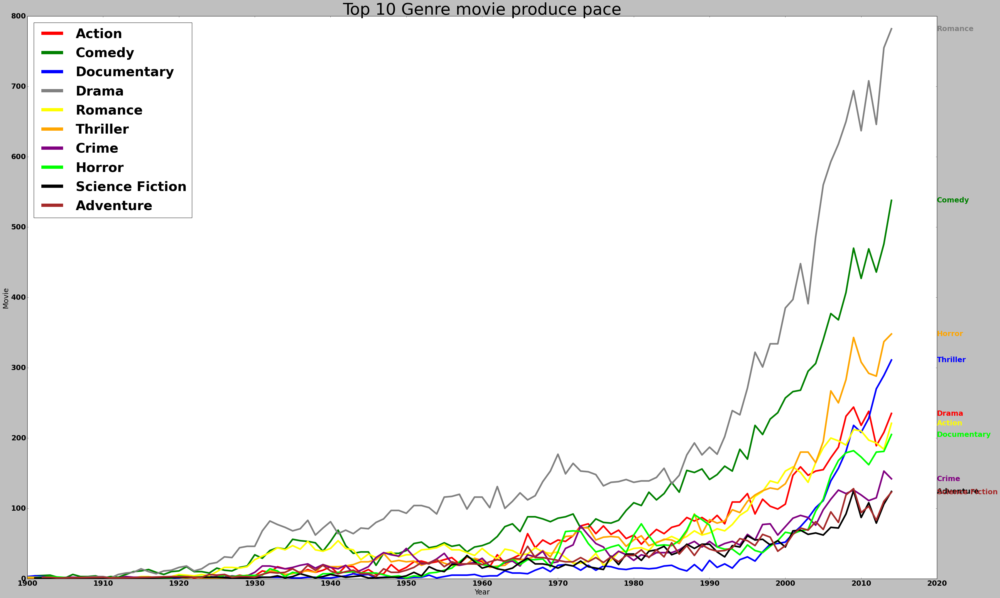

In [7]:
# Set varible and option
plt.figure(figsize=(50,30))

# Preparing the data
genre_list = df_genre.groupby('name').count().nlargest(n=10,columns='movieid').reset_index().name.values
df_plot = df_genremerge[['year','name','movieid']].query("year >= 1900 and year <= 2014 and name in @genre_list ").groupby(['year','name']).count().sort_values(by=['year','name']).reset_index()
ax = sns.lineplot(data=df_plot,x='year',y='movieid',hue='name', palette=['red', 'green','blue','grey','yellow','orange','purple','Lime','black','brown'], lw=5)

# Setting the x label
x_interval = 10
x_tic = [df_plot.year.min() + (i*x_interval) for i in range(math.ceil((df_plot.year.max() - df_plot.year.min() )/x_interval)+1)]

# Plotting the data
leg = plt.legend(loc = "upper left",fontsize="40",)
plt.xticks(x_tic)
plt.ylabel('Movie')
plt.xlabel('Year')
plt.title('Top 10 Genre movie produce pace', fontsize=50)

# Setting the line width
for legobj in leg.legendHandles:
    legobj.set_linewidth(10.0)

# Setting the legend at the end of line
for p,l in enumerate(ax.lines):
    y = l.get_ydata()
    if len(y)>0:
        ax.annotate(genre_list[p], xy=(1,y[-1]), xycoords=('axes fraction', 'data'), 
                     ha='left', va='center', color=l.get_color())


What is the top 15 movie generating the most revenue thoughout the decade

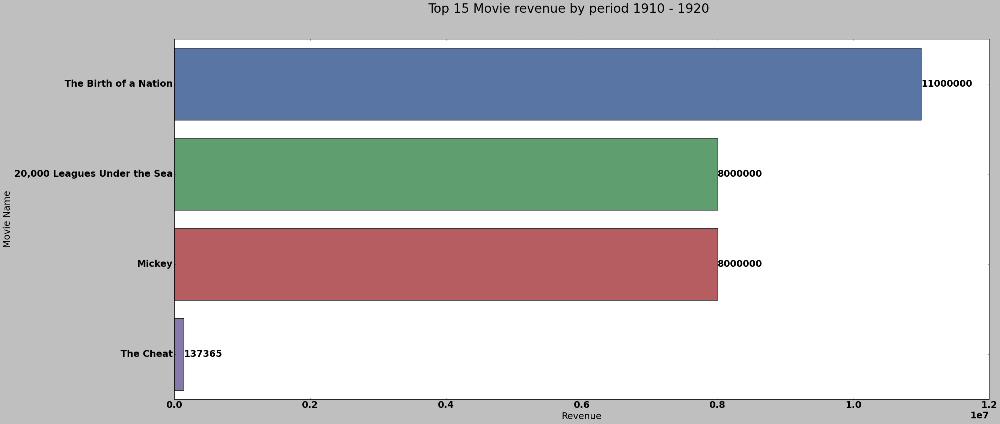

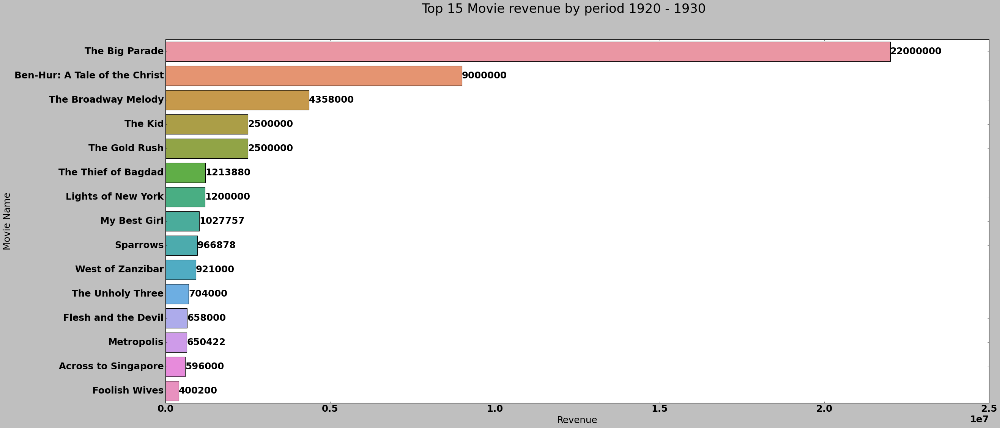

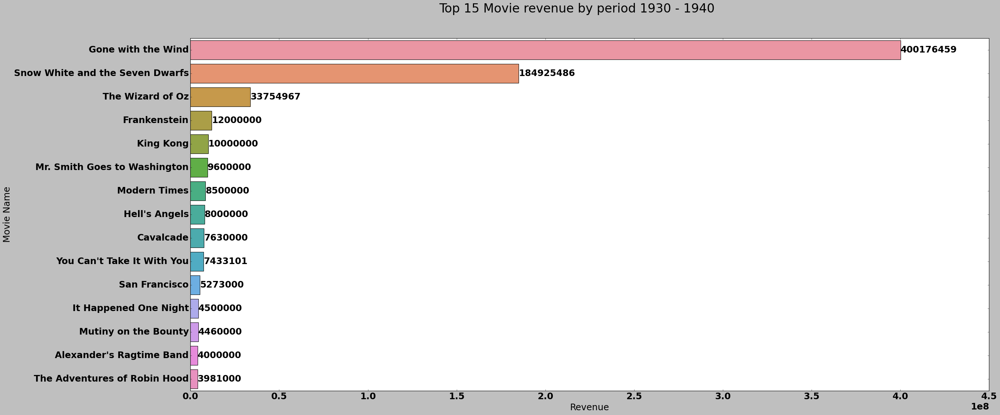

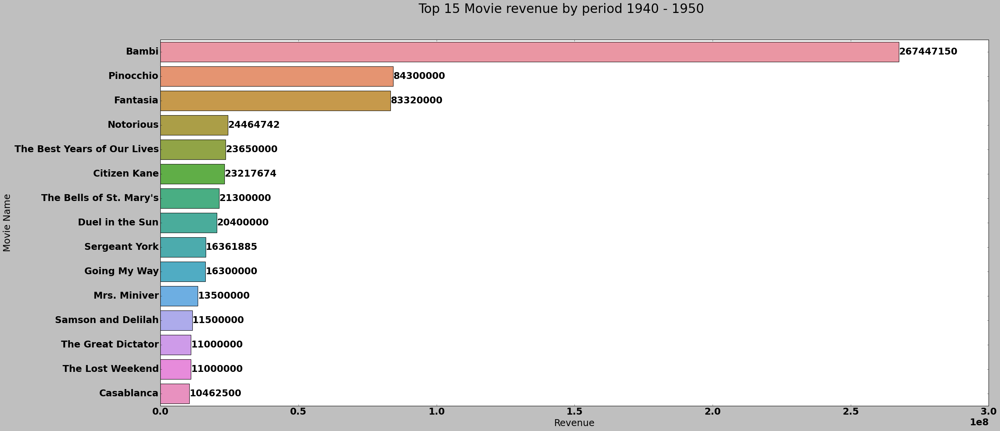

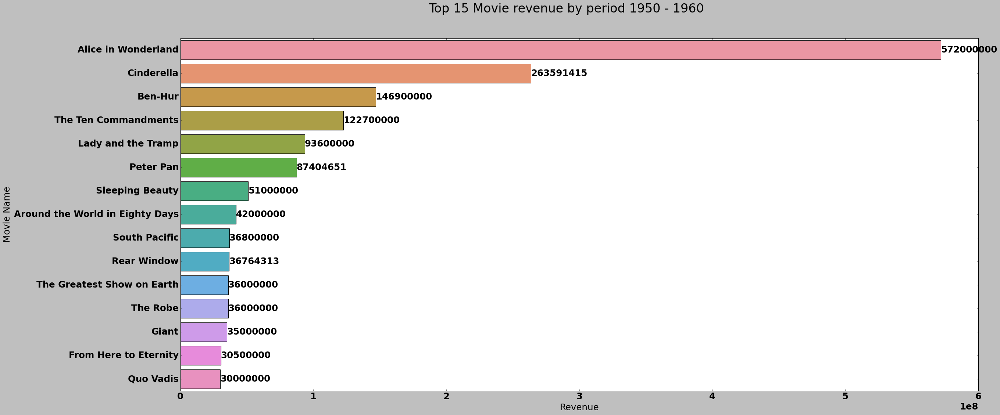

...

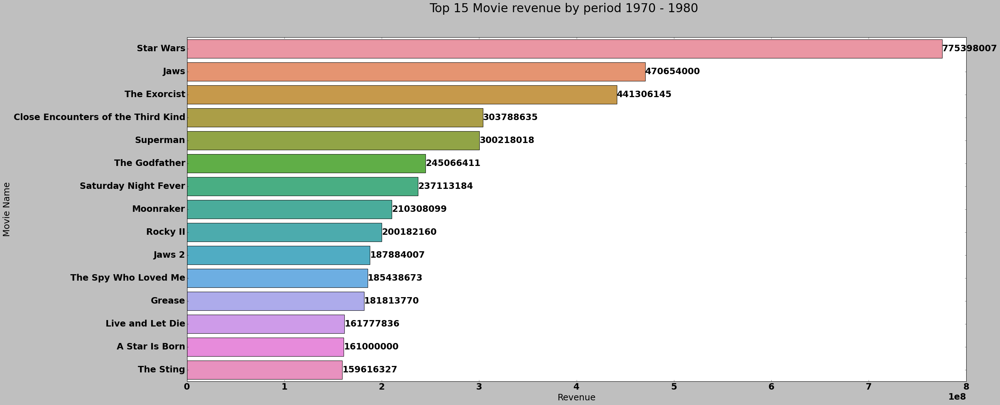

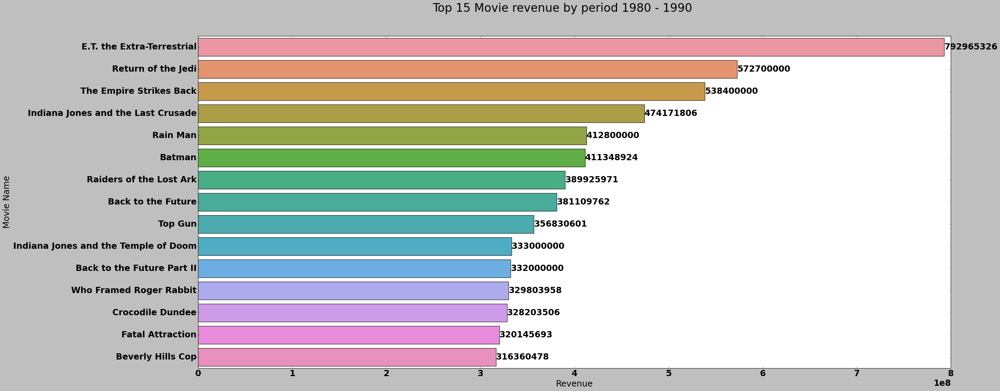

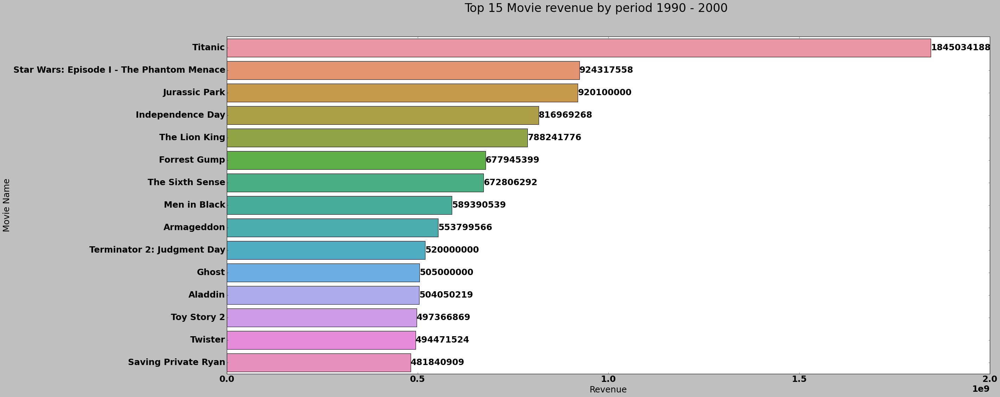

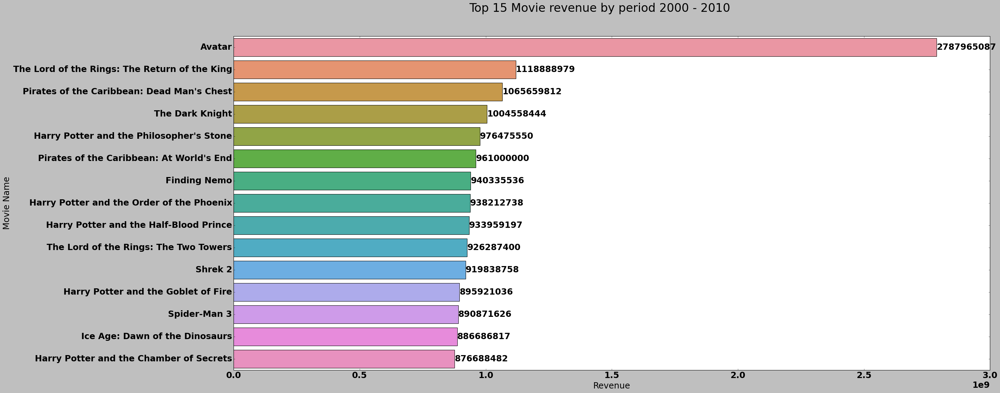

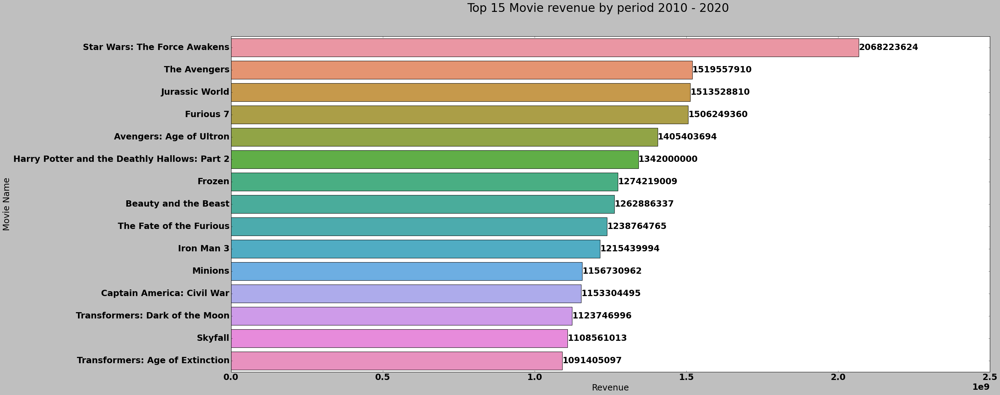

In [8]:
# Creating varible
period_list = df_main_rev.sort_values('year').period.unique()
rank = 15

# Plotting the data
for period in period_list:
    plt.figure(figsize=(35,15))
    # Prepare the data base on the period
    df_plot = df_main_rev.query("period == @period")[['original_title','revenue','popularity']].nlargest(n=rank,columns=['revenue','popularity']).reset_index(drop=True)
    ax = sns.barplot(data=df_plot,x='revenue',y='original_title')
    plt.suptitle(f'Top {rank} Movie revenue by period {period}',fontsize=30)
    for container in ax.containers:
        ax.bar_label(container,label_type='edge',fmt='%.f')
    plt.xlabel('Revenue')
    plt.ylabel('Movie Name')
    plt.show()


Which actor star in most movie throughout the decade

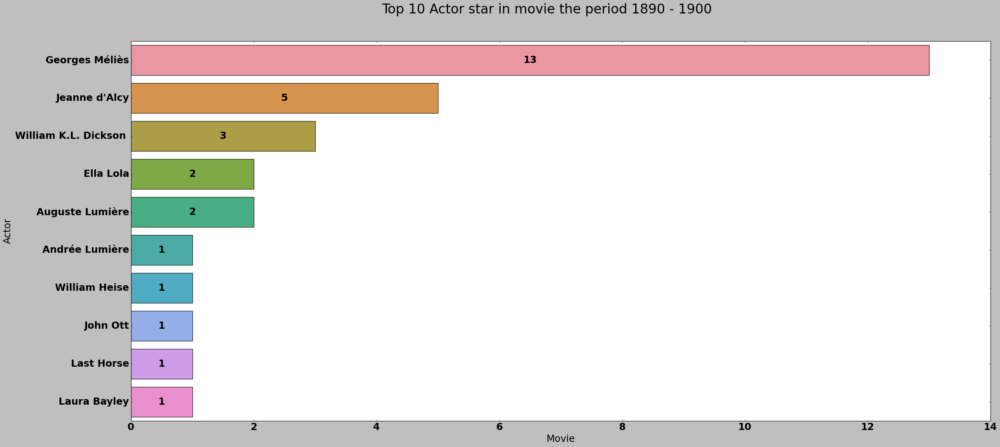

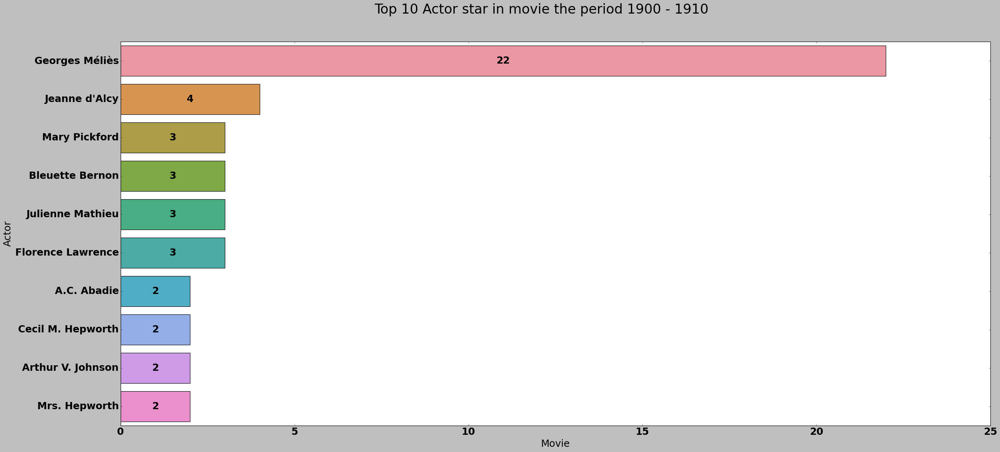

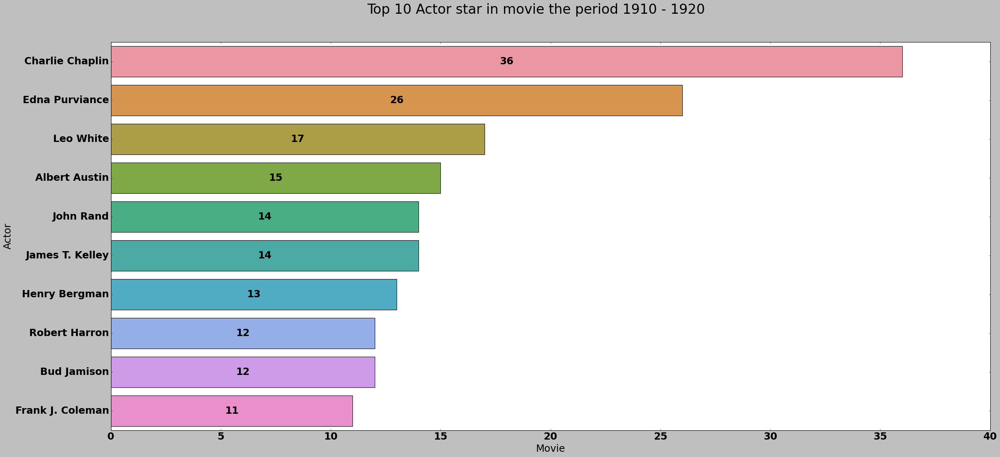

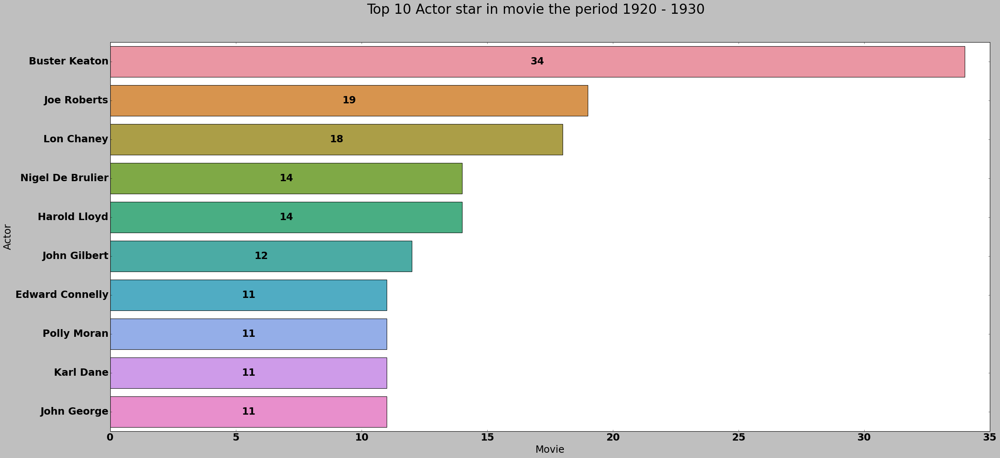

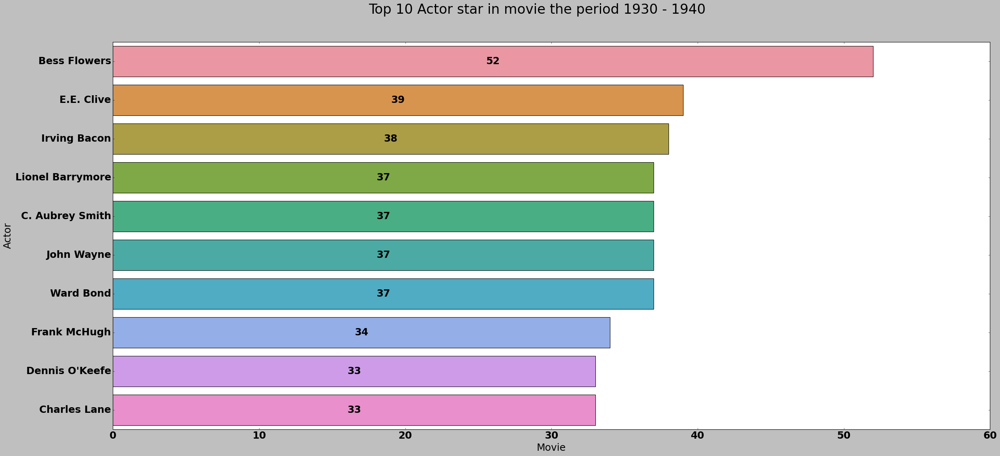

...

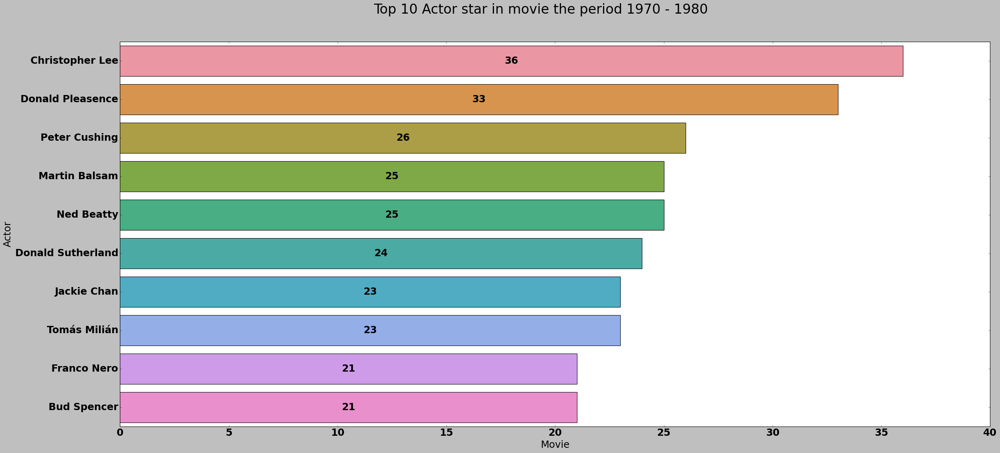

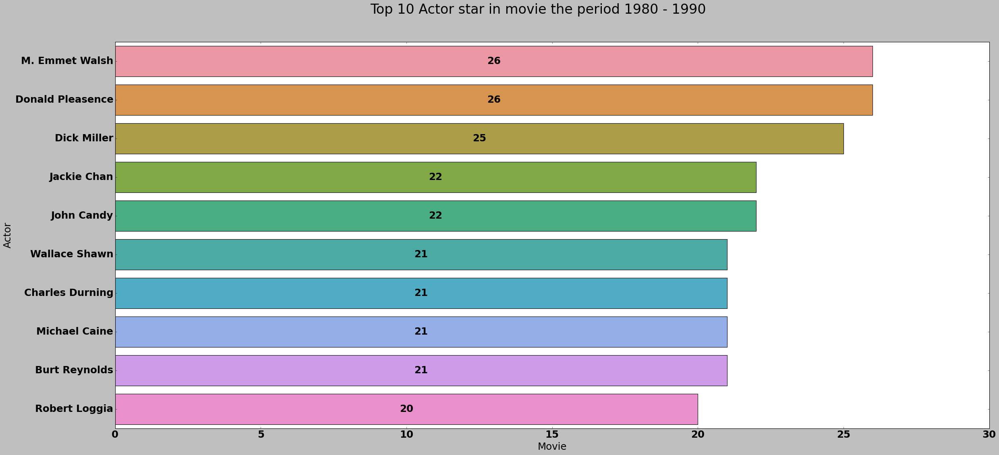

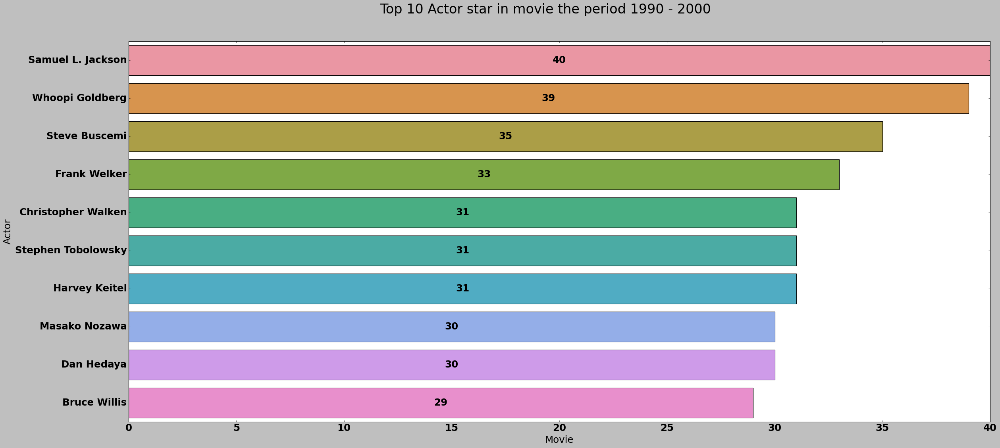

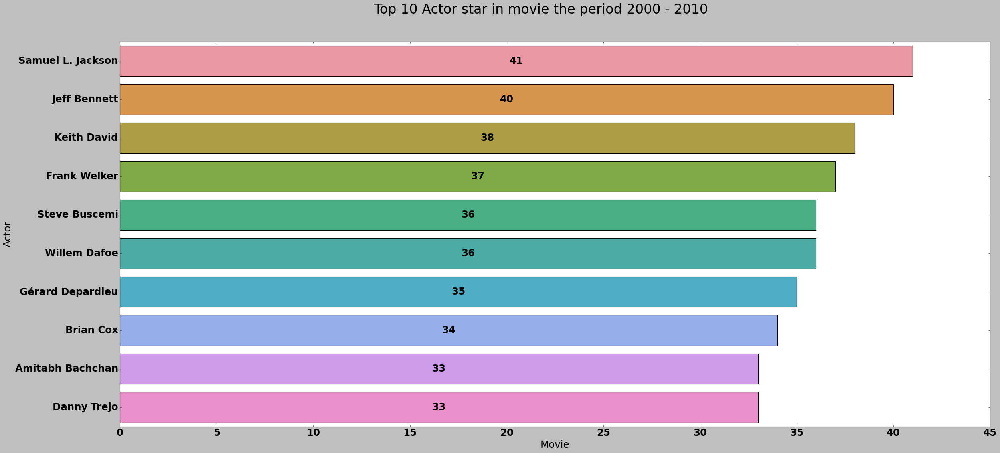

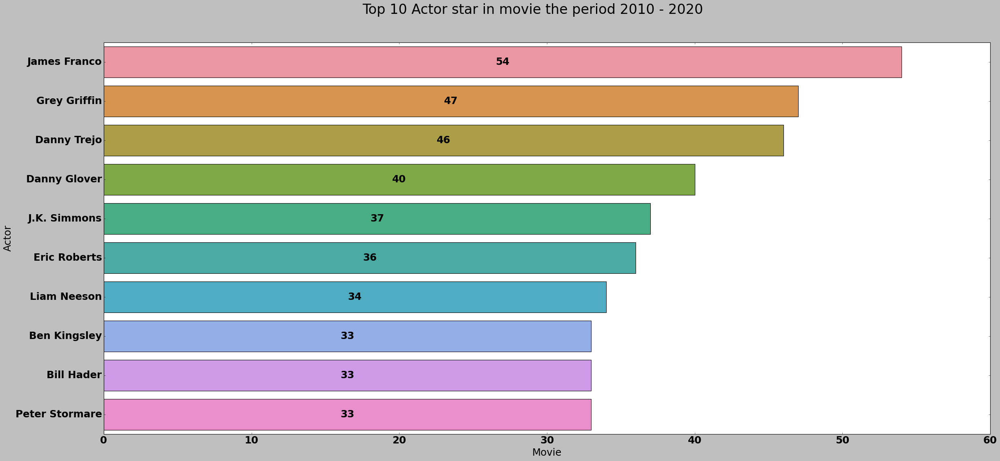

In [9]:
# Setting the visual
plt.style.use('seaborn-deep')
font = {'family' : 'DejaVu Sans',
        'weight' : 'bold',
        'size'   : 22}
rank = 10
plt.rc('font', **font)

# Prepare data for plot
df_plot = df_castmerge.query("name != 'Missing' and year > 1890")[['period','name','original_title']].groupby(['period','name']).count().reset_index()
df_plot = df_plot.sort_values('original_title',ascending=False).groupby(['period']).head(rank).sort_values(['period','original_title'],ascending=[True,False]).reset_index(drop=True)
period_list = df_plot.period.unique()

# Plotting the data
for period in period_list:
    plt.figure(figsize=(35,15)) 
    df_filter = df_plot.query("period == @period")    
    ax = sns.barplot(data=df_filter,x='original_title',y='name')
    for container in ax.containers:
        ax.bar_label(container,label_type='center',fmt='%.f') 
    plt.suptitle(f'Top {rank} Actor star in movie the period {period}',fontsize=30)
    plt.xlabel('Movie')
    plt.ylabel('Actor')
    plt.show()

Which actor generate the most revenue throughout the decade

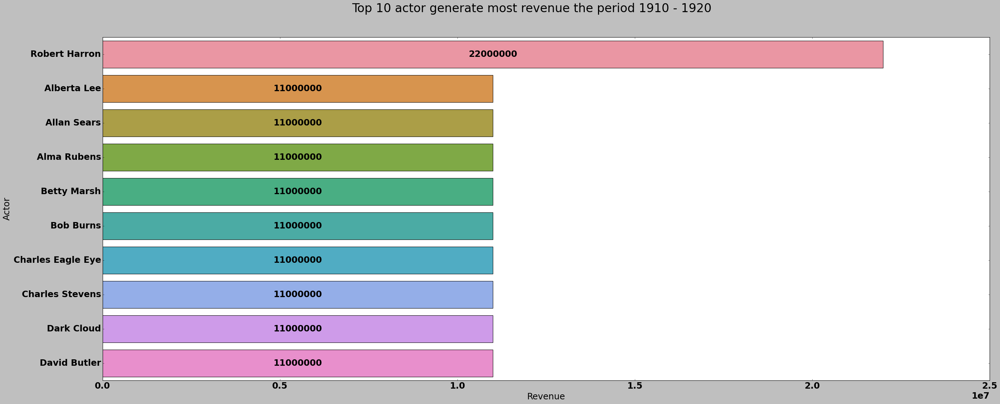

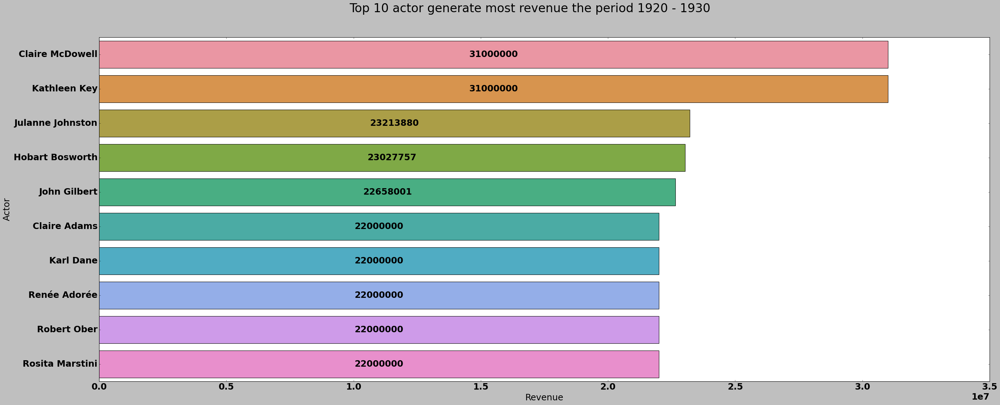

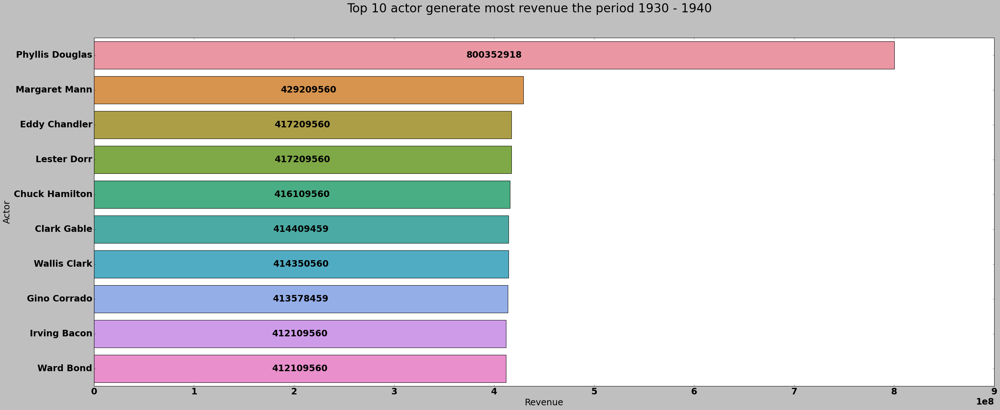

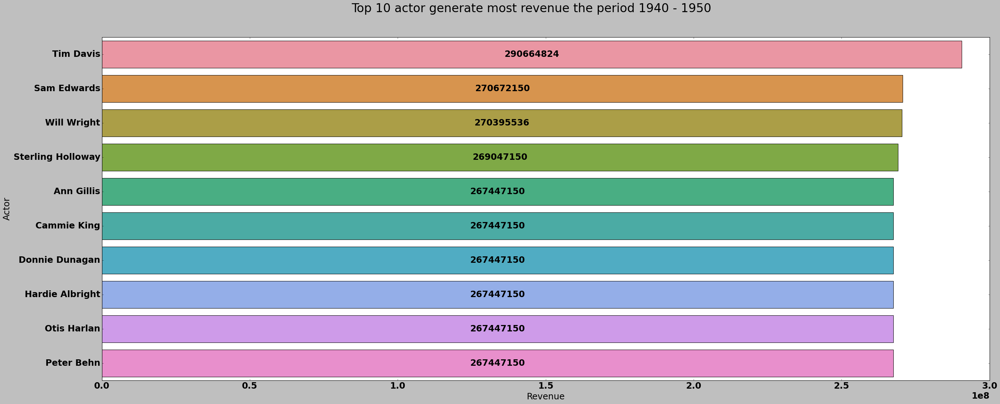

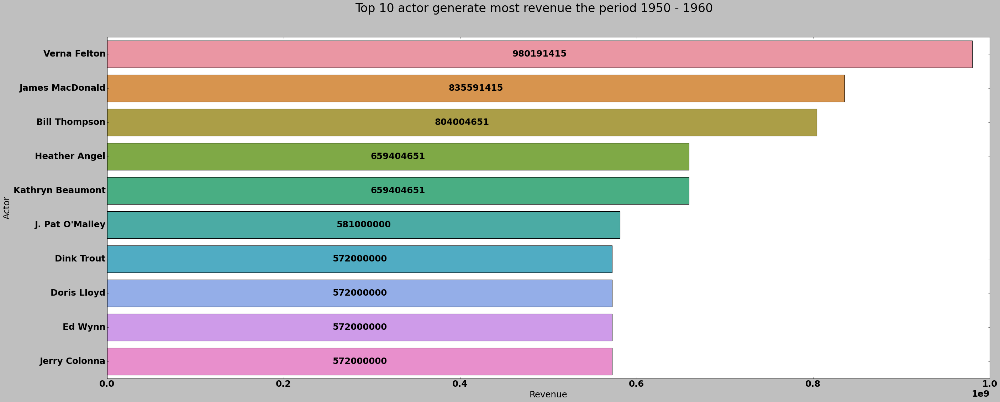

...

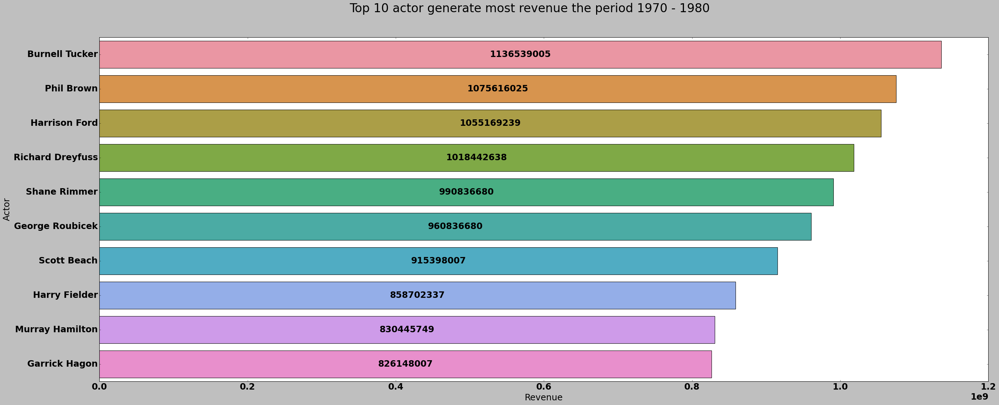

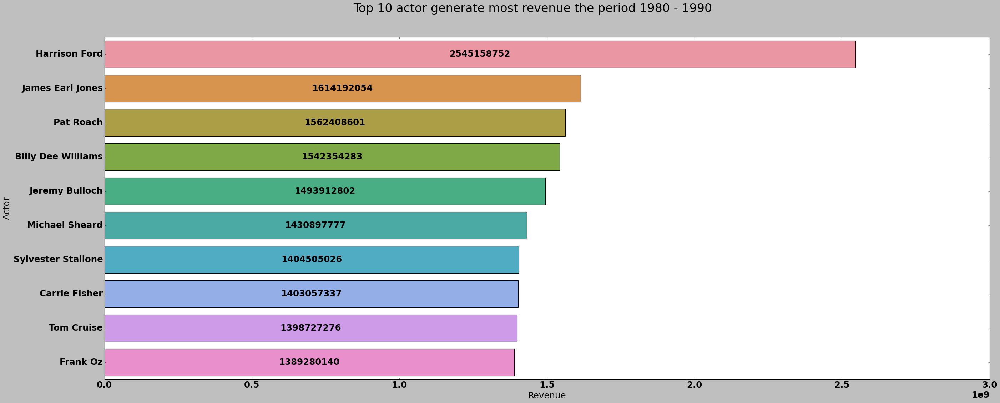

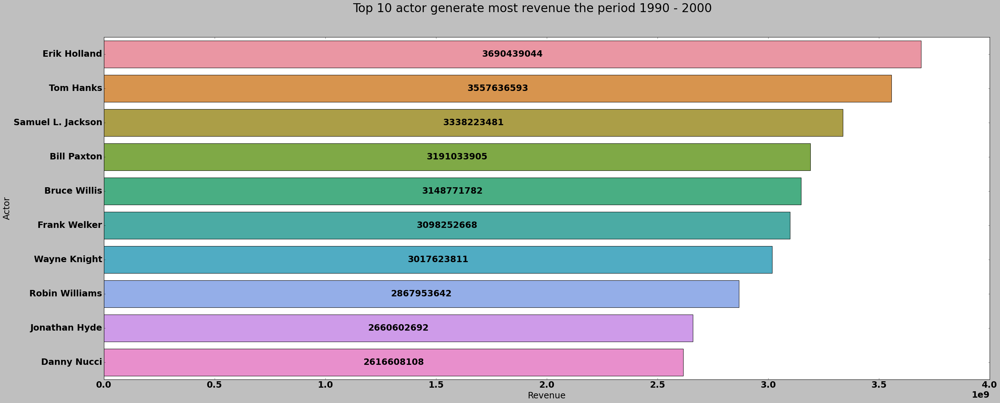

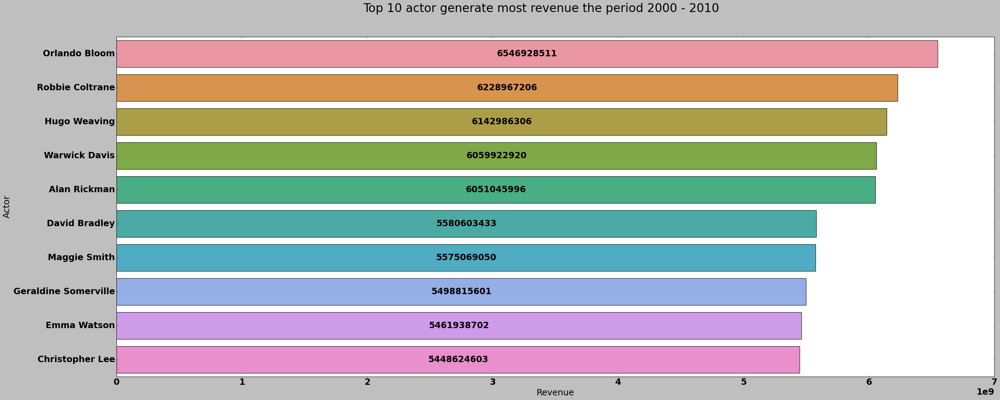

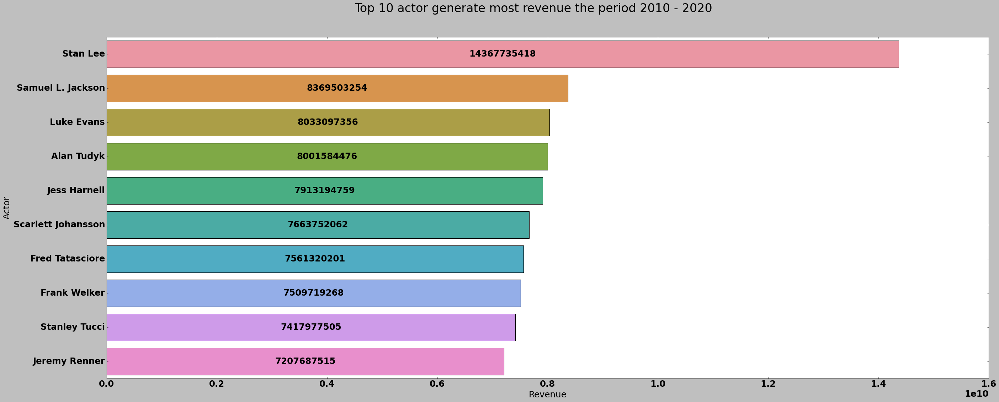

In [10]:
# Setting the visual
plt.style.use('classic')
font = {'family' : 'DejaVu Sans',
        'weight' : 'bold',
        'size'   : 22}
plt.rc('font', **font)
rank = 10

# Prepare data for plot
df_plot = df_castmerge.query("name != 'Missing' and year > 1890 and revenue != 0")[['name','revenue','period']].groupby(['name','period']).sum().sort_values(['period','revenue'],ascending=[True,False]).reset_index()
df_plot = df_plot.groupby(['period']).head(rank).reset_index(drop=True)
period_list = df_plot.period.unique()

# Plotting the data
for period in period_list:
    plt.figure(figsize=(40,15))
    df_filter = df_plot.query("period == @period")
    plt.suptitle(f'Top {rank} actor generate most revenue the period {period}',fontsize=30)
    ax = sns.barplot(data=df_filter,x='revenue',y='name')
    for container in ax.containers:
        ax.bar_label(container,label_type='center',fmt='%.f')  
    plt.xlabel('Revenue')
    plt.ylabel('Actor')
    plt.show()


Which directory dicrect the most movie

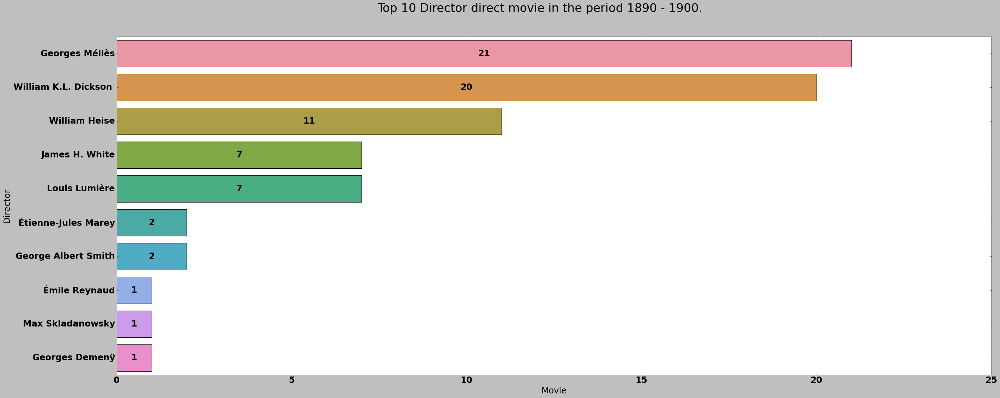

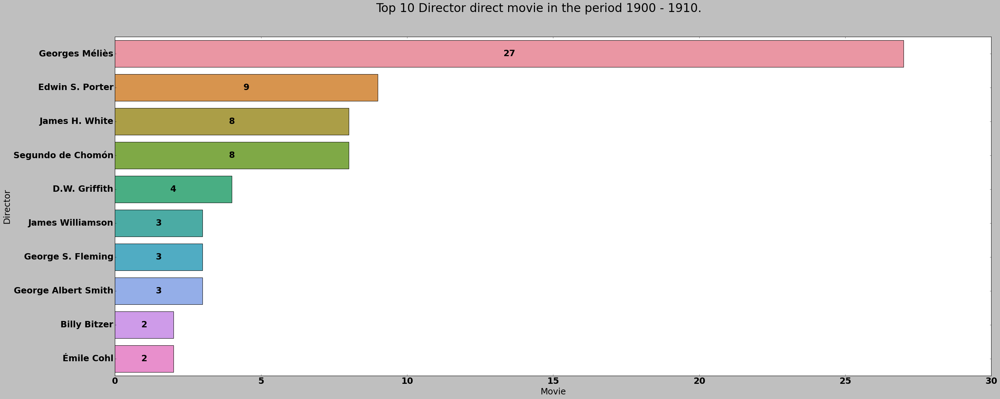

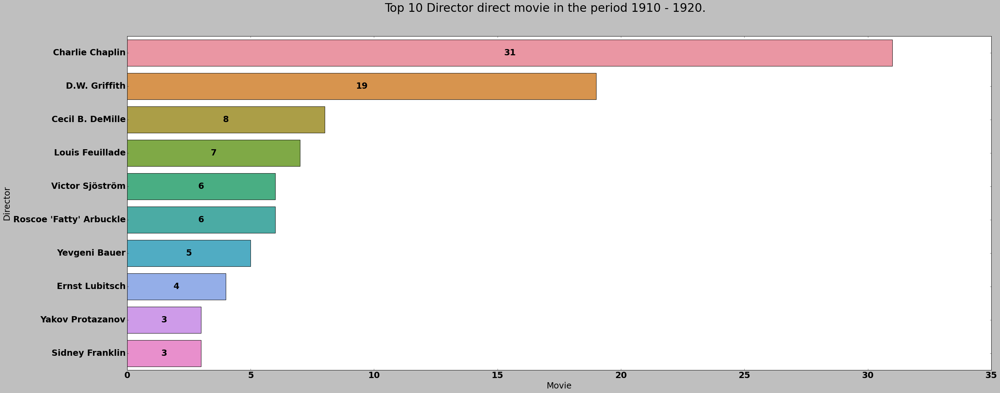

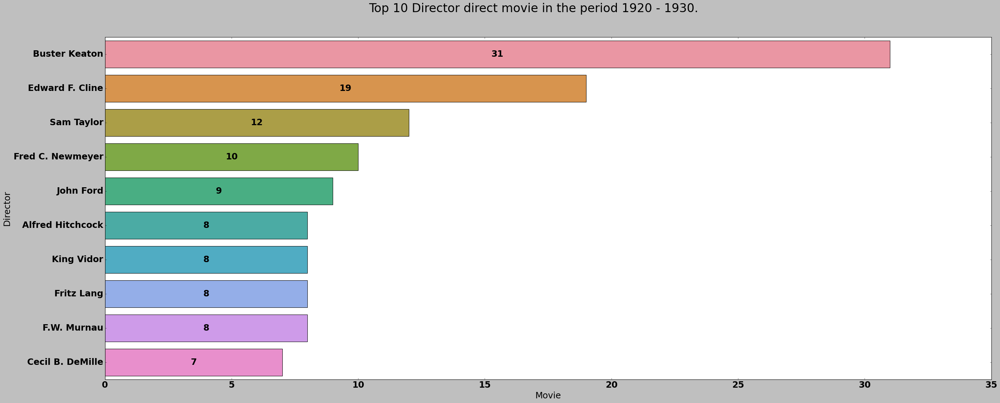

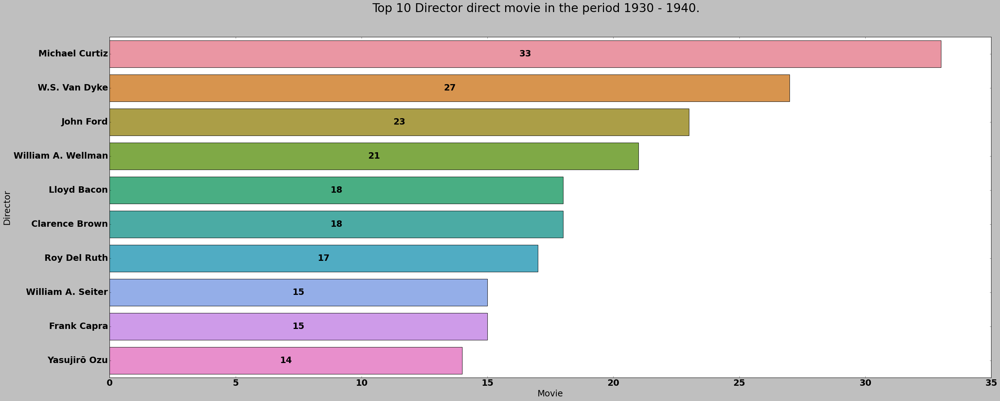

...

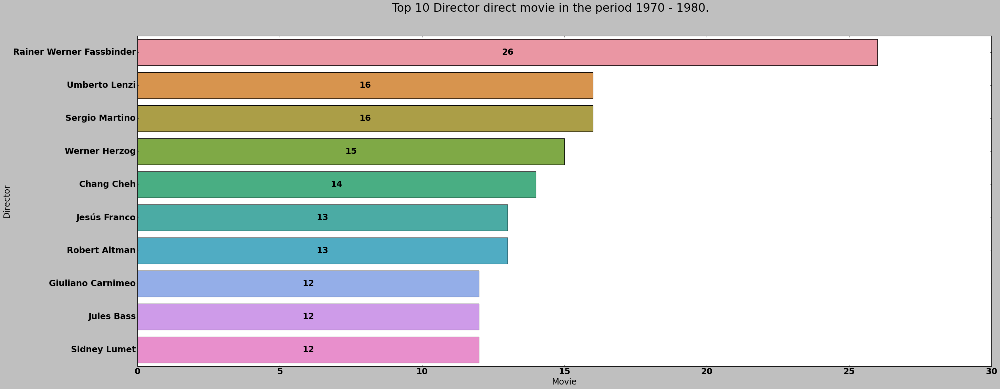

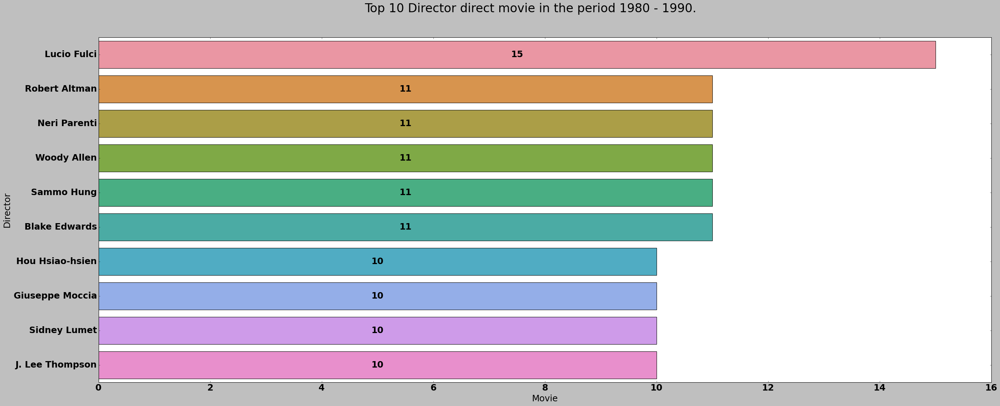

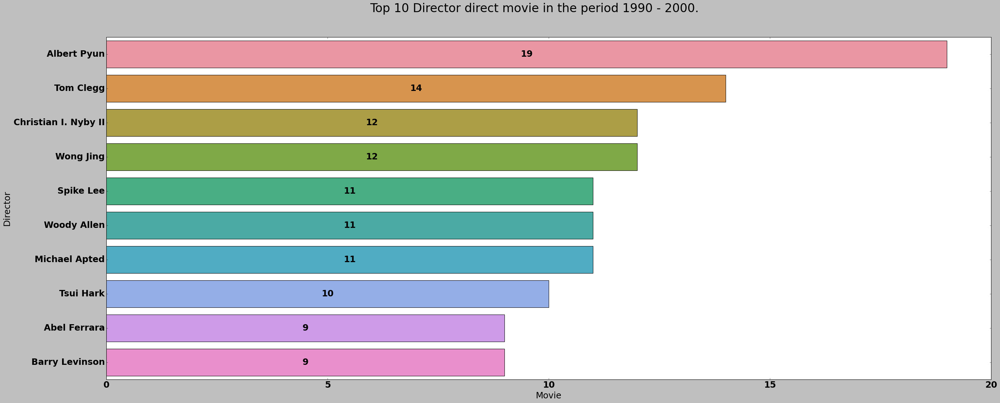

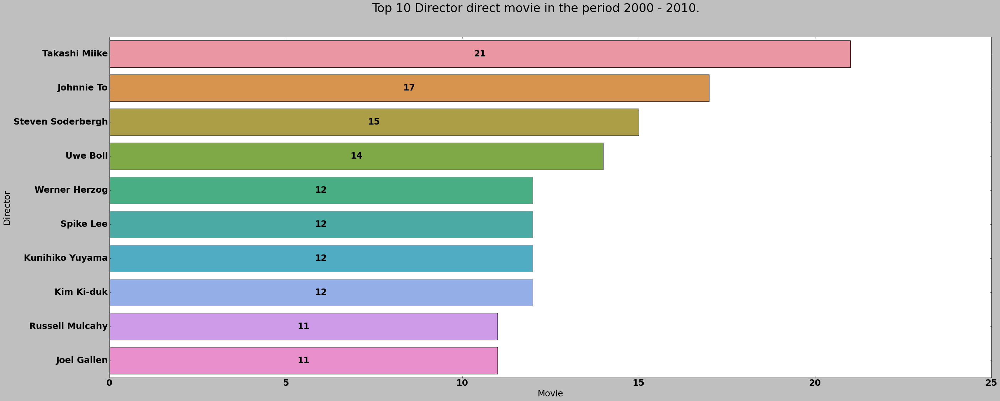

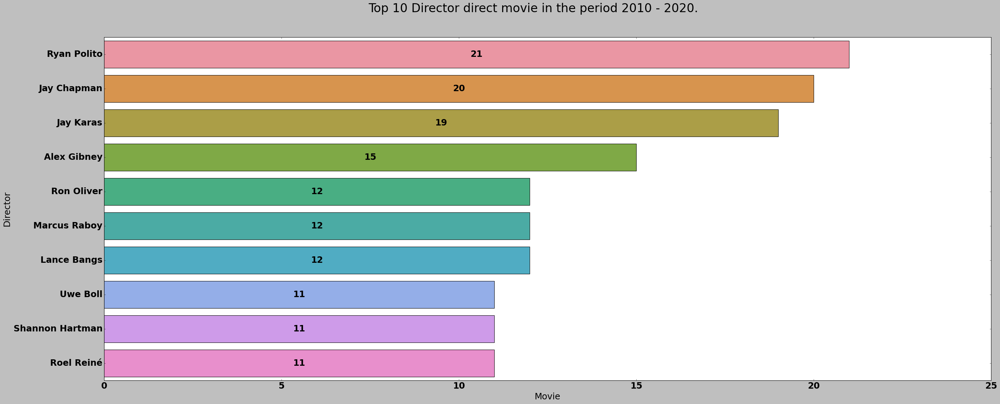

In [11]:
# Prepare data for plot
rank = 10
df_plot = df_crewmerge.query("name != 'Missing' and job == 'Director' and year > 1890 ")[['name','original_title','period']].groupby(['name','period']).count().sort_values(['period','original_title'],ascending=[True,False]).reset_index()
df_plot = df_plot.sort_values('original_title',ascending=False).groupby(['period']).head(rank).sort_values(['period','original_title'],ascending=[True,False]).reset_index(drop=True)
period_list = df_plot.period.unique()

# Plotting the data
for period in period_list:
    plt.figure(figsize=(40,15))
    df_filter = df_plot.query("period == @period")
    plt.suptitle(f'Top {rank} Director direct movie in the period {period}.',fontsize=30)
    ax = sns.barplot(data=df_filter,x='original_title',y='name')
    for container in ax.containers:
        ax.bar_label(container,label_type='center',fmt='%.f')  
    plt.xlabel('Movie')
    plt.ylabel('Director')
    plt.show()


Which Director generate the most revenue throughout the decade

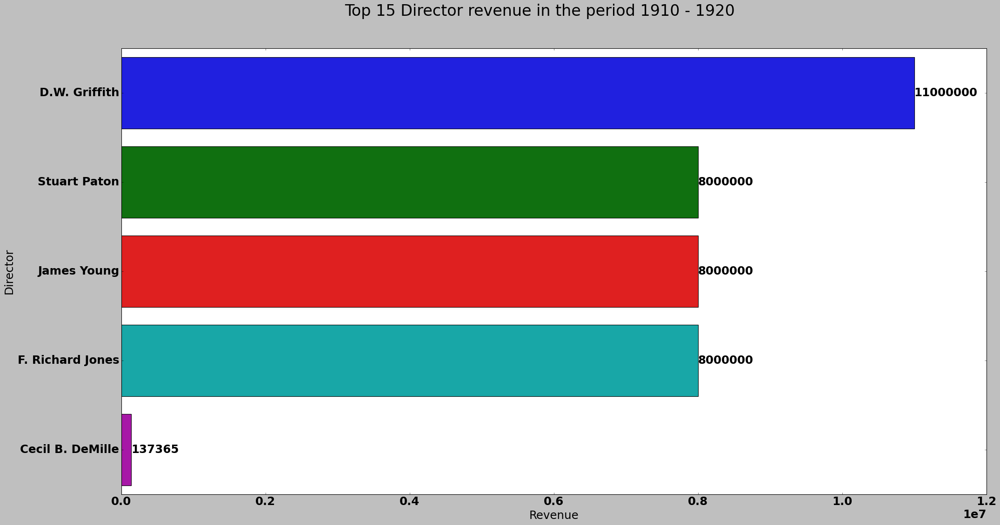

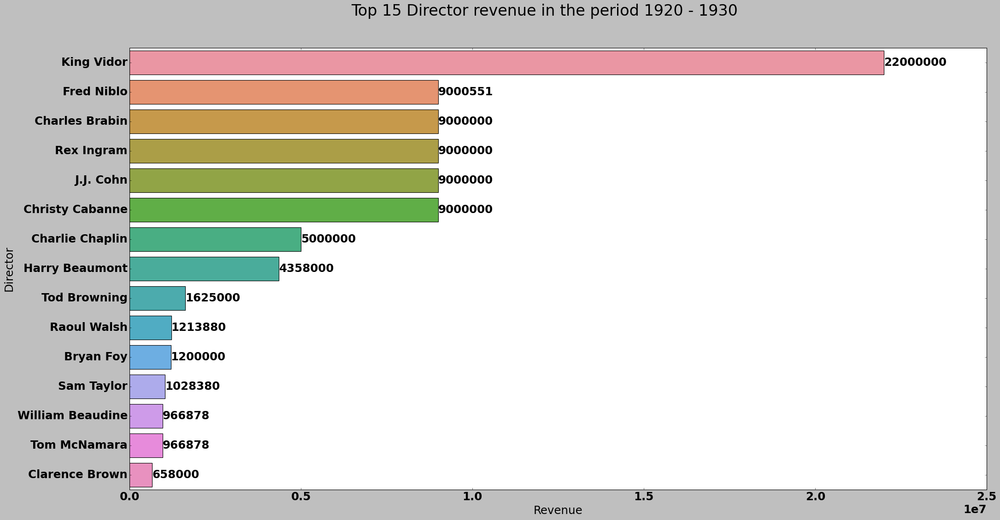

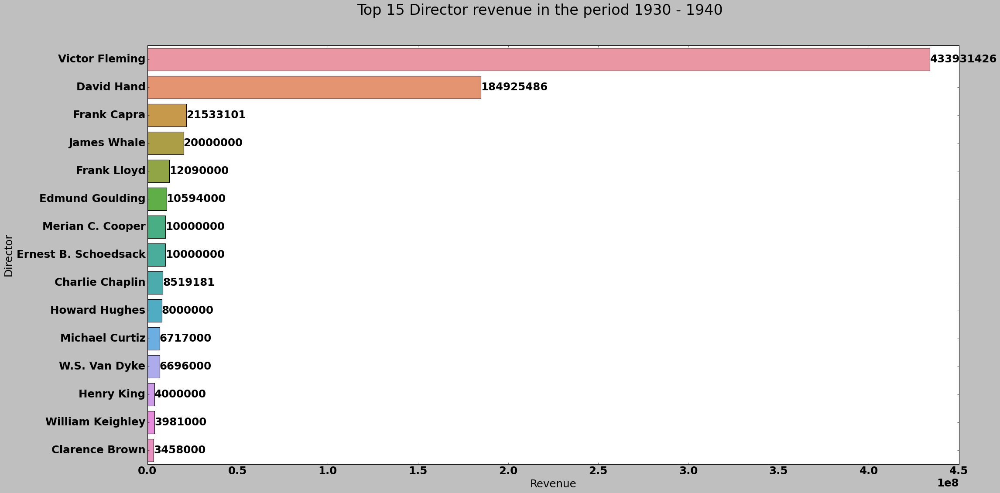

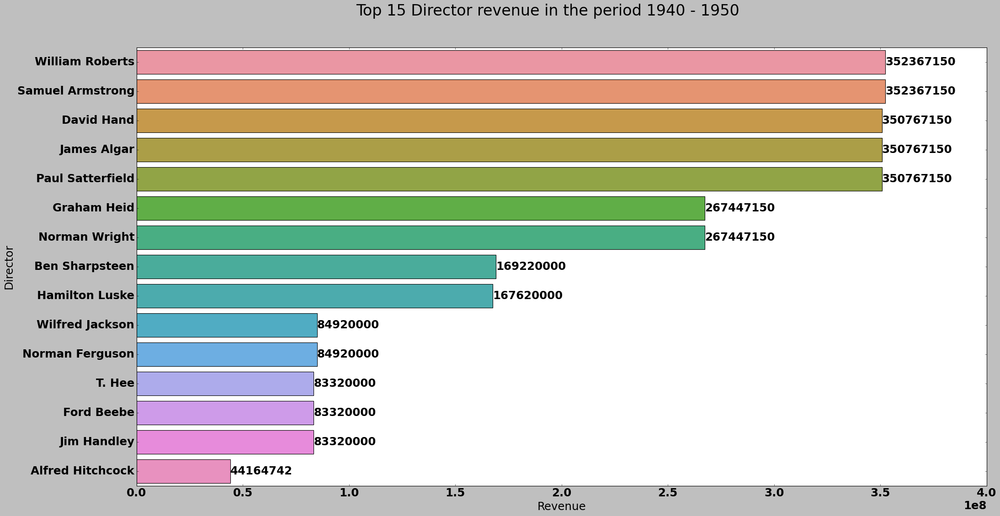

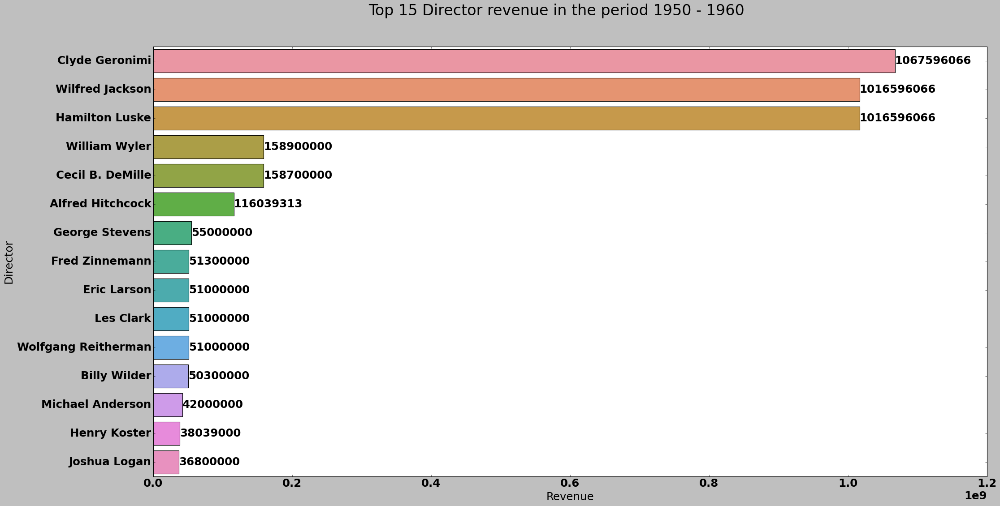

...

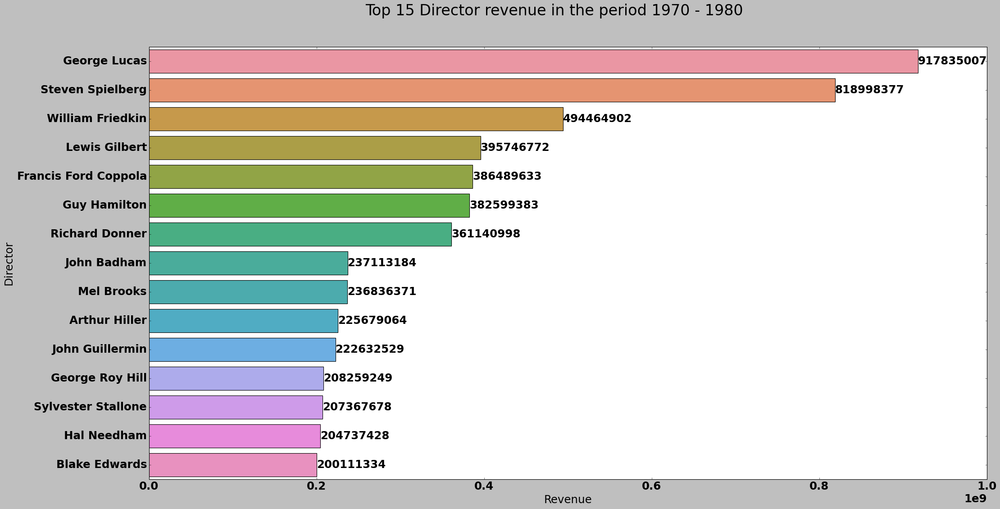

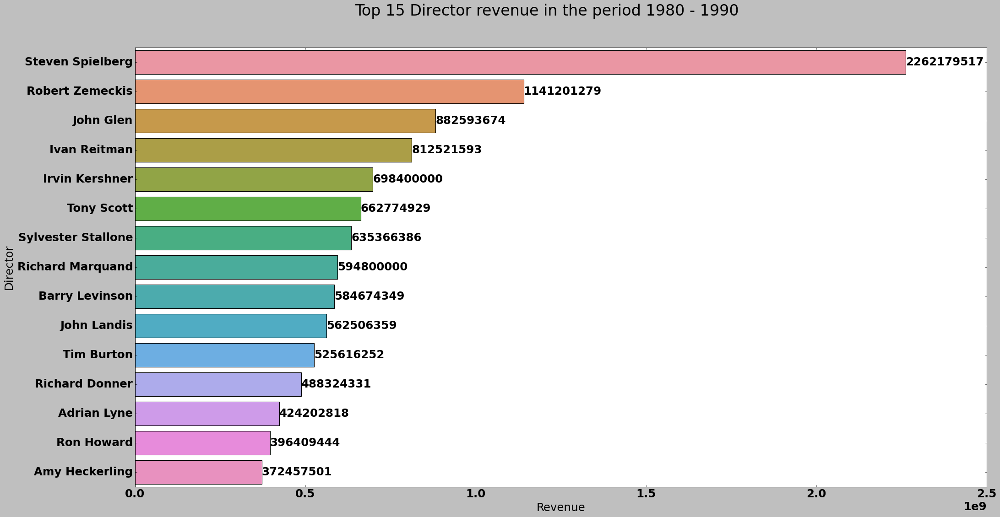

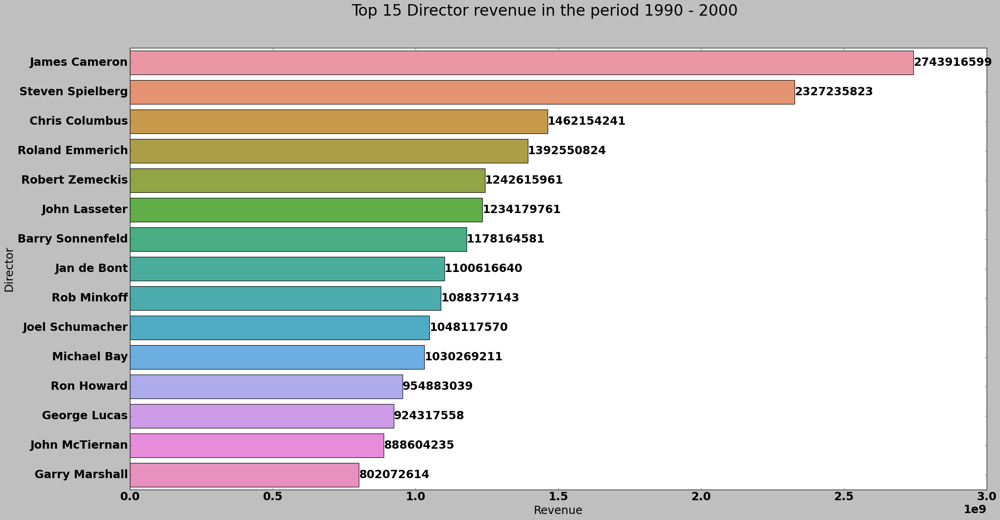

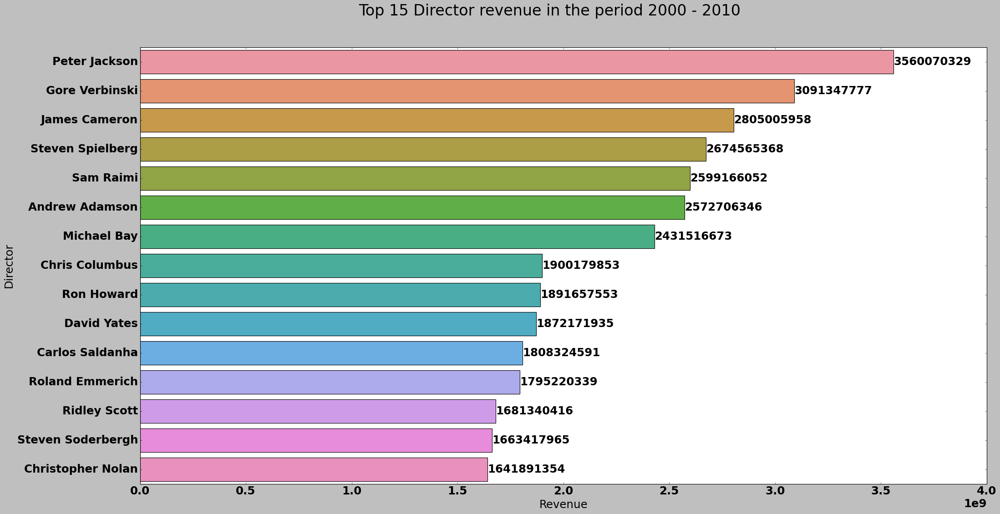

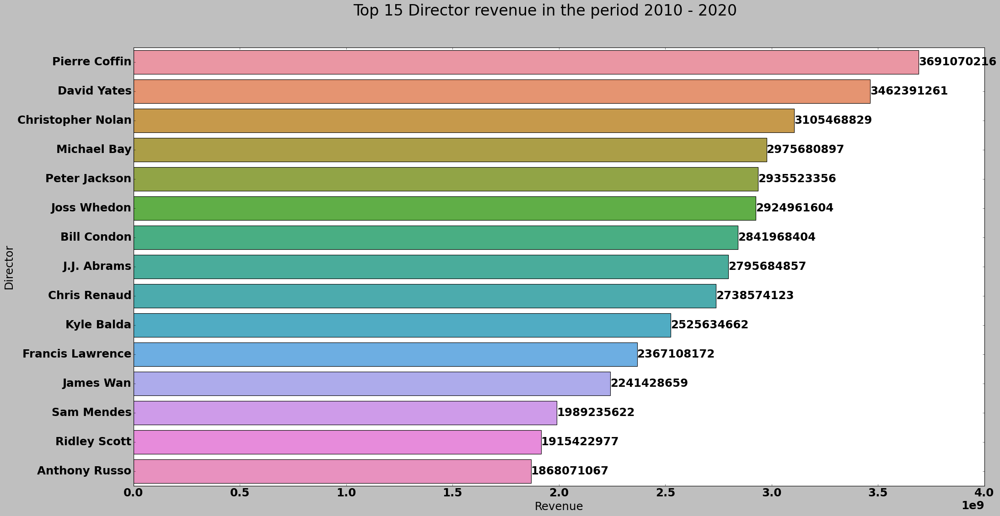

In [12]:
# Prepare data for plot
rank = 15
df_plot = df_crewmerge.query("name != 'Missing' and job == 'Director' and year > 1890 and revenue != 0")[['name','revenue','period']].groupby(['name','period']).sum().sort_values(['period','revenue'],ascending=[True,False]).reset_index()
df_plot = df_plot.sort_values('revenue',ascending=False).groupby(['period']).head(rank).sort_values(['period','revenue'],ascending=[True,False]).reset_index(drop=True)
period_list = df_plot.period.unique()

# Plotting the data
for period in period_list:
    plt.figure(figsize=(30,15))
    df_filter = df_plot.query("period == @period")
    plt.suptitle(f'Top {rank} Director revenue in the period {period}',fontsize=30)
    ax = sns.barplot(data=df_filter,x='revenue',y='name')
    for container in ax.containers:
        ax.bar_label(container,label_type='edge',fmt='%.f')  
    plt.xlabel('Revenue')
    plt.ylabel('Director')
    plt.show()
